# Project Name

# EDA and Statistical Analysis of FIFA Case Study

# Goals
1. Using the core statistical theoretical concepts and knowledge to solve real time problem 
statements.
2. Visualize a real time industry scenario where one can use these statistical concepts.
3. Detailed data analysis and number crunching using statistics
4. Exhaustive report building using EDA and visualization techniques to help the business 
take decisions using insights from the data

# Specifications

Part -II on the other hand is dataset based and explore various data cleaning options, data analysis 
options and using EDA to derive deep and meaningful insights for the business

# PART-B ( Dataset Based)

# EDA and STATS Mini Project-FIFA Case Study :
A new football club named ‘Brussels United FC’ has just been inaugurated. This club does 
not have a team yet. The team is looking to hire players for their roster. Management wants 
to make such decisions using a data-based approach. During a recent hiring drive, you 
were selected for the Data Science team as a Junior data scientist. Your team has been 
tasked with creating a report which recommends players for the main team. To start with, a 
total of 15 players are required. Player data for all teams have been acquired from FIFA. 
This data contains information about the players, the clubs they are currently playing for, 
and various performance measures. There is a limited budget for hiring players. The team 
needs 20 possible players to choose from. You have been requested to formulate a report 
in order to help the management make a decision regarding potential players.

# Data:
The data contains details for over 25490 players playing in various football clubs in Europe. 
It contains information on age, skill rating, wages, player value, etc. The files provided are 
as follows: fifa.csv – data file. fifa_ variable_information.csv - information on individual 
variables.

# Data Preprocessing:

# 1. Import the necessary libraries and read the data

In [81]:
import pandas as pd
import numpy as np

import math

import matplotlib.pyplot as plt
%matplotlib inline
import seaborn as sns

import statistics
from scipy import stats

import scipy.special
import scipy.stats as stats
import scipy.special


from scipy.stats import shapiro
from scipy.stats import ttest_ind
from scipy.stats import chi2_contingency

In [2]:
# display all columns of the dataframe
pd.options.display.max_columns = None

# display all rows of the dataframe
pd.options.display.max_rows = None

# return an output value upto 6 decimals
pd.options.display.float_format = '{:.6f}'.format

In [4]:
df=pd.read_csv("fifa.csv")
df.head()

,ID,Name,Age,Photo,Nationality,Flag,Overall,Potential,Club,Club Logo,Value,Wage,Preferred Foot,International Reputation,Weak Foot,Skill Moves,Work Rate,Body Type,Position,Jersey Number,Joined,Loaned From,Contract Valid Until,Height,Weight,Crossing,Finishing,HeadingAccuracy,ShortPassing,Volleys,Dribbling,Curve,FKAccuracy,LongPassing,BallControl,Acceleration,SprintSpeed,Agility,Reactions,Balance,ShotPower,Jumping,Stamina,Strength,LongShots,Aggression,Interceptions,Positioning,Vision,Penalties,Composure,Marking,StandingTackle,SlidingTackle,GKDiving,GKHandling,GKKicking,GKPositioning,GKReflexes,Release Clause
0,240331,P. Camará,21,https://cdn.sofifa.org/players/4/19/240331.png,Guinea Bissau,https://cdn.sofifa.org/flags/119.png,58,69,Crawley Town,https://cdn.sofifa.org/teams/2/light/110890.png,€220K,€1K,Right,1.000000,3.000000,2.000000,High/ Medium,Lean,LS,28.000000,"Jun 8, 2017",NaN,2019,6'1,161lbs,34.000000,55.000000,57.000000,42.000000,37.000000,58.000000,33.000000,25.000000,28.000000,57.000000,78.000000,80.000000,61.000000,45.000000,63.000000,58.000000,57.000000,58.000000,62.000000,56.000000,27.000000,13.000000,55.000000,45.000000,58.000000,46.000000,14.000000,18.000000,15.000000,7.000000,9.000000,9.000000,6.000000,15.000000,€429K
1,183465,J. Rodwell,27,https://cdn.sofifa.org/players/4/19/183465.png,England,https://cdn.sofifa.org/flags/14.png,68,68,Blackburn Rovers,https://cdn.sofifa.org/teams/2/light/3.png,€925K,€16K,Right,2.000000,3.000000,3.000000,Medium/ Medium,Normal,CM,5.000000,"Aug 23, 2018",NaN,2019,6'2,172lbs,67.000000,63.000000,74.000000,71.000000,64.000000,64.000000,66.000000,47.000000,67.000000,71.000000,60.000000,61.000000,69.000000,60.000000,62.000000,72.000000,76.000000,51.000000,71.000000,70.000000,70.000000,68.000000,67.000000,70.000000,57.000000,69.000000,66.000000,69.000000,64.000000,9.000000,10.000000,15.000000,11.000000,12.000000,€1.8M
2,205186,P. Gazzaniga,26,https://cdn.sofifa.org/players/4/19/205186.png,Argentina,https://cdn.sofifa.org/flags/52.png,74,78,Tottenham Hotspur,https://cdn.sofifa.org/teams/2/light/18.png,€5M,€46K,Right,1.000000,3.000000,1.000000,Medium/ Medium,Lean,GK,22.000000,"Aug 23, 2017",NaN,2022,6'5,198lbs,21.000000,12.000000,14.000000,32.000000,8.000000,20.000000,33.000000,21.000000,49.000000,20.000000,63.000000,65.000000,64.000000,59.000000,49.000000,49.000000,66.000000,45.000000,67.000000,19.000000,32.000000,16.000000,13.000000,52.000000,41.000000,55.000000,23.000000,20.000000,11.000000,76.000000,73.000000,84.000000,72.000000,76.000000,€9.6M
3,233531,Y. Soteldo,21,https://cdn.sofifa.org/players/4/19/233531.png,Venezuela,https://cdn.sofifa.org/flags/61.png,71,81,Universidad de Chile,https://cdn.sofifa.org/teams/2/light/15029.png,€3.8M,€6K,Right,1.000000,4.000000,3.000000,Medium/ Medium,Normal,CAM,10.000000,"Jan 11, 2018",NaN,2018,5'3,121lbs,65.000000,55.000000,15.000000,74.000000,61.000000,76.000000,55.000000,63.000000,66.000000,74.000000,90.000000,81.000000,83.000000,58.000000,92.000000,60.000000,50.000000,60.000000,30.000000,66.000000,20.000000,24.000000,65.000000,68.000000,71.000000,65.000000,25.000000,23.000000,20.000000,13.000000,7.000000,9.000000,13.000000,6.000000,€6.1M
4,243718,R. Koot,18,https://cdn.sofifa.org/players/4/19/243718.png,Netherlands,https://cdn.sofifa.org/flags/34.png,56,68,Fortuna Sittard,https://cdn.sofifa.org/teams/2/light/634.png,€120K,€1K,Right,1.000000,2.000000,1.000000,Medium/ Medium,Normal,GK,27.000000,"Jul 1, 2016",NaN,2020,6'1,176lbs,11.000000,6.000000,13.000000,19.000000,9.000000,12.000000,10.000000,10.000000,18.000000,14.000000,30.000000,19.000000,25.000000,48.000000,44.000000,17.000000,64.000000,20.000000,45.000000,5.000000,25.000000,11.000000,4.000000,30.000000,15.000000,39.000000,11.000000,14.000000,12.000000,59.000000,55.000000,59.000000,55.000000,56.000000,€198K


In [6]:
df.shape

(25490, 60)

In [7]:
df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 25490 entries, 0 to 25489
Data columns (total 60 columns):
 #   Column                    Non-Null Count  Dtype  
---  ------                    --------------  -----  
 0   ID                        25490 non-null  int64  
 1   Name                      25490 non-null  object 
 2   Age                       25490 non-null  int64  
 3   Photo                     25490 non-null  object 
 4   Nationality               25490 non-null  object 
 5   Flag                      25490 non-null  object 
 6   Overall                   25490 non-null  int64  
 7   Potential                 25490 non-null  int64  
 8   Club                      25159 non-null  object 
 9   Club Logo                 25490 non-null  object 
 10  Value                     25490 non-null  object 
 11  Wage                      25490 non-null  object 
 12  Preferred Foot            25425 non-null  object 
 13  International Reputation  25425 non-null  float64
 14  Weak F

# 2. Drop any columns that you deem unnecessary for analysis.
Hint: At least keep the following columns
['ID','Name','Age','Nationality','Overall','Potential','Value','Wage','Joined','Preferred Foot',
'Contract Valid Until', 'Height', 'Weight', 'Penalties', 'Release Clause',’ International
Reputation’, ‘Position’]
We encourage you to perform an analysis including other variables apart from the above 
variables

In [15]:
# Read the FIFA dataset
df = pd.read_csv("fifa.csv")

# Specify the columns to keep
columns_to_keep = ['ID','Name','Age','Nationality','Overall','Potential','Value','Wage','Joined','Preferred Foot',
                    'Contract Valid Until','Height','Weight','Penalties','Release Clause',"International Reputation",
                    "Position"]

# Drop the unnecessary columns
df = df[columns_to_keep]

# Display the first few rows of the DataFrame
df.head()

,ID,Name,Age,Nationality,Overall,Potential,Value,Wage,Joined,Preferred Foot,Contract Valid Until,Height,Weight,Penalties,Release Clause,International Reputation,Position
0,240331,P. Camará,21,Guinea Bissau,58,69,€220K,€1K,"Jun 8, 2017",Right,2019,6'1,161lbs,58.000000,€429K,1.000000,LS
1,183465,J. Rodwell,27,England,68,68,€925K,€16K,"Aug 23, 2018",Right,2019,6'2,172lbs,57.000000,€1.8M,2.000000,CM
2,205186,P. Gazzaniga,26,Argentina,74,78,€5M,€46K,"Aug 23, 2017",Right,2022,6'5,198lbs,41.000000,€9.6M,1.000000,GK
3,233531,Y. Soteldo,21,Venezuela,71,81,€3.8M,€6K,"Jan 11, 2018",Right,2018,5'3,121lbs,71.000000,€6.1M,1.000000,CAM
4,243718,R. Koot,18,Netherlands,56,68,€120K,€1K,"Jul 1, 2016",Right,2020,6'1,176lbs,15.000000,€198K,1.000000,GK


In [8]:
df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 25490 entries, 0 to 25489
Data columns (total 17 columns):
 #   Column                    Non-Null Count  Dtype  
---  ------                    --------------  -----  
 0   ID                        25490 non-null  int64  
 1   Name                      25490 non-null  object 
 2   Age                       25490 non-null  int64  
 3   Nationality               25490 non-null  object 
 4   Overall                   25490 non-null  int64  
 5   Potential                 25490 non-null  int64  
 6   Value                     25490 non-null  object 
 7   Wage                      25490 non-null  object 
 8   Joined                    23319 non-null  object 
 9   Preferred Foot            25425 non-null  object 
 10  Contract Valid Until      25094 non-null  object 
 11  Height                    25425 non-null  object 
 12  Weight                    25425 non-null  object 
 13  Penalties                 25425 non-null  float64
 14  Releas

# Insight 
After reading the FIFA dataset, this code removes any extraneous columns from the DataFrame and chooses the columns to keep in the columns_to_keep list. A DataFrame containing only the designated columns will be the outcome.

# 3. The following columns need to be converted for further analysis:
Value = Remove currency symbol and suffix and convert to Float 

Wage = Remove currency symbol and suffix and convert to Float 

joined = Convert to int with only year

Contract Valid Until = convert to DateTime type

Height = convert float with decimal points

weight = Remove Suffix and convert to float

Release Clause = Convert to float after getting rid of currency symbol and suffix


(You might encounter Nan values in the above columns. Pandas treat Nan values as a 
float. Please keep that in mind when making the conversions.)



In [9]:
df.head()

,ID,Name,Age,Nationality,Overall,Potential,Value,Wage,Joined,Preferred Foot,Contract Valid Until,Height,Weight,Penalties,Release Clause,International Reputation,Position
0,240331,P. Camará,21,Guinea Bissau,58,69,€220K,€1K,"Jun 8, 2017",Right,2019,6'1,161lbs,58.000000,€429K,1.000000,LS
1,183465,J. Rodwell,27,England,68,68,€925K,€16K,"Aug 23, 2018",Right,2019,6'2,172lbs,57.000000,€1.8M,2.000000,CM
2,205186,P. Gazzaniga,26,Argentina,74,78,€5M,€46K,"Aug 23, 2017",Right,2022,6'5,198lbs,41.000000,€9.6M,1.000000,GK
3,233531,Y. Soteldo,21,Venezuela,71,81,€3.8M,€6K,"Jan 11, 2018",Right,2018,5'3,121lbs,71.000000,€6.1M,1.000000,CAM
4,243718,R. Koot,18,Netherlands,56,68,€120K,€1K,"Jul 1, 2016",Right,2020,6'1,176lbs,15.000000,€198K,1.000000,GK


In [10]:
df.shape

(25490, 17)

In [16]:
# Read the FIFA dataset
df = df[columns_to_keep]

# Convert 'Value' and 'Wage' columns to float after removing currency symbol and suffix, handling NaN values
df['Value'] = df['Value'].str.replace(r'[€MKB]+', '', regex=True).astype(float)
df['Wage'] = df['Wage'].str.replace(r'[€KMB]+', '', regex=True).astype(float)

# Convert 'Joined' to integer (Year) with only year, handling NaN values
df['Joined'] = pd.to_datetime(df['Joined'], errors='coerce').dt.year

# Convert 'Contract Valid Until' to DateTime type, handling NaN values
df['Contract Valid Until'] = pd.to_datetime(df['Contract Valid Until'], errors='coerce')

# Convert 'Height' to float with decimal points, handling NaN values
df['Height'] = df['Height'].str.replace("'", '.').astype(float)

# Convert 'Weight' to float after removing the suffix 'lbs', handling NaN values
df['Weight'] = df['Weight'].str.replace('lbs', '').astype(float)

# Convert 'Release Clause' to float after removing currency symbol and suffix, handling NaN values
df['Release Clause'] = df['Release Clause'].str.replace(r'[€MKB]+', '', regex=True).astype(float)

# Display the first few rows of the DataFrame with the converted columns
df.head()

,ID,Name,Age,Nationality,Overall,Potential,Value,Wage,Joined,Preferred Foot,Contract Valid Until,Height,Weight,Penalties,Release Clause,International Reputation,Position
0,240331,P. Camará,21,Guinea Bissau,58,69,220.000000,1.000000,2017.000000,Right,2019-01-01,6.100000,161.000000,58.000000,429.000000,1.000000,LS
1,183465,J. Rodwell,27,England,68,68,925.000000,16.000000,2018.000000,Right,2019-01-01,6.200000,172.000000,57.000000,1.800000,2.000000,CM
2,205186,P. Gazzaniga,26,Argentina,74,78,5.000000,46.000000,2017.000000,Right,2022-01-01,6.500000,198.000000,41.000000,9.600000,1.000000,GK
3,233531,Y. Soteldo,21,Venezuela,71,81,3.800000,6.000000,2018.000000,Right,2018-01-01,5.300000,121.000000,71.000000,6.100000,1.000000,CAM
4,243718,R. Koot,18,Netherlands,56,68,120.000000,1.000000,2016.000000,Right,2020-01-01,6.100000,176.000000,15.000000,198.000000,1.000000,GK


# Insight 
Using regular expressions and pandas functions, this code manages NaN values while taking care of the necessary data type conversions and formatting for the specified columns. After running this code, you will obtain the FIFA dataset with the required column conversions.

# 4. Check the duplicate records and do appropriate treatments

In [19]:
# Check for duplicate records based on all columns
duplicates = df[df.duplicated(keep='first')]

# Print the duplicate records
print("Duplicate Records:")
print(duplicates)

# Drop the duplicate records (keeping the first occurrence)
df = df.drop_duplicates(keep='first')

# Check again for duplicates after removal
duplicates_after_removal = df[df.duplicated(keep='first')]
print("Duplicate Records After Removal:")
print(duplicates_after_removal)

Duplicate Records:
Empty DataFrame
Columns: [ID, Name, Age, Nationality, Overall, Potential, Value, Wage, Joined, Preferred Foot, Contract Valid Until, Height, Weight, Penalties, Release Clause, International Reputation, Position]
Index: []
Duplicate Records After Removal:
Empty DataFrame
Columns: [ID, Name, Age, Nationality, Overall, Potential, Value, Wage, Joined, Preferred Foot, Contract Valid Until, Height, Weight, Penalties, Release Clause, International Reputation, Position]
Index: []


In [17]:
df.head()

,ID,Name,Age,Nationality,Overall,Potential,Value,Wage,Joined,Preferred Foot,Contract Valid Until,Height,Weight,Penalties,Release Clause,International Reputation,Position
0,240331,P. Camará,21,Guinea Bissau,58,69,220.000000,1.000000,2017.000000,Right,2019-01-01,6.100000,161.000000,58.000000,429.000000,1.000000,LS
1,183465,J. Rodwell,27,England,68,68,925.000000,16.000000,2018.000000,Right,2019-01-01,6.200000,172.000000,57.000000,1.800000,2.000000,CM
2,205186,P. Gazzaniga,26,Argentina,74,78,5.000000,46.000000,2017.000000,Right,2022-01-01,6.500000,198.000000,41.000000,9.600000,1.000000,GK
3,233531,Y. Soteldo,21,Venezuela,71,81,3.800000,6.000000,2018.000000,Right,2018-01-01,5.300000,121.000000,71.000000,6.100000,1.000000,CAM
4,243718,R. Koot,18,Netherlands,56,68,120.000000,1.000000,2016.000000,Right,2020-01-01,6.100000,176.000000,15.000000,198.000000,1.000000,GK


In [18]:
df.shape

(13657, 17)

# Insight
This code does the following:

choose which of the designated columns to retain after reading the FIFA dataset.

searches all columns for duplicate records, which are then stored in the duplicates DataFrame.

Prints the duplicate records.

Drops the duplicate records, keeping the first occurrence.

Checks for duplicates again after removal and prints the result.

This code helps identify and remove duplicate records from the DataFrame based on all selected columns.

# 5. Check the variation of the features.
Check the variation of the features.
If you are performing variance and standard deviation. Kindly explain why the variances of 
the variables are higher than the standard deviation.
Also, explain which one tells the exact variation of the features.
Based on this analysis decide which feature is not needed.


In [20]:
# Calculate the standard deviation for numerical columns
numeric_columns = df.select_dtypes(include=[int, float])
std_deviation = numeric_columns.std()

# Print the standard deviation for each feature
print("Standard Deviation of Features:")
print(std_deviation)

Standard Deviation of Features:
ID                         29868.556965
Age                            4.644942
Overall                        6.901866
Potential                      6.114532
Value                        289.120568
Wage                          21.880284
Joined                         2.119364
Height                         0.448780
Weight                        15.595479
Penalties                     15.714240
Release Clause               299.594530
International Reputation       0.388449
dtype: float64


# Insight
For the numerical features (columns) in the DataFrame, this code computes and outputs the standard deviation. The standard deviation is computed for the columns that have been chosen and filtered. This aids in your comprehension of how each numerical feature in the dataset varies.


# 6. Check for missing values and do imputations where necessary.
Note: Do the appropriate imputation based on the distribution.


Hints:
Few analyses are listed below to decide which imputation method to perform.

1. Skewness level verification

2. Kurtosis level measurement identification,
Explain what the Skewness and Kurtosis depicted.

3. Distribution plots like KDE, Distribution plot, Box plot, etc.


In [23]:
df.head()

,ID,Name,Age,Nationality,Overall,Potential,Value,Wage,Joined,Preferred Foot,Contract Valid Until,Height,Weight,Penalties,Release Clause,International Reputation,Position
0,240331,P. Camará,21,Guinea Bissau,58,69,220.000000,1.000000,2017.000000,Right,2019-01-01,6.100000,161.000000,58.000000,429.000000,1.000000,LS
1,183465,J. Rodwell,27,England,68,68,925.000000,16.000000,2018.000000,Right,2019-01-01,6.200000,172.000000,57.000000,1.800000,2.000000,CM
2,205186,P. Gazzaniga,26,Argentina,74,78,5.000000,46.000000,2017.000000,Right,2022-01-01,6.500000,198.000000,41.000000,9.600000,1.000000,GK
3,233531,Y. Soteldo,21,Venezuela,71,81,3.800000,6.000000,2018.000000,Right,2018-01-01,5.300000,121.000000,71.000000,6.100000,1.000000,CAM
4,243718,R. Koot,18,Netherlands,56,68,120.000000,1.000000,2016.000000,Right,2020-01-01,6.100000,176.000000,15.000000,198.000000,1.000000,GK


In [21]:
# Check for missing values in the DataFrame
missing_values = df.isnull().sum()

# Print the missing values count for each column
print("Missing Values:")
print(missing_values)

# Impute missing values based on distribution for numerical columns
numeric_columns = df.select_dtypes(include=[int, float])
for column in numeric_columns:
    if missing_values[column] > 0:
        median_value = df[column].median()  # You can choose mean, median, or mode based on distribution
        df[column].fillna(median_value, inplace=True)

# Impute missing values with mode for categorical columns
categorical_columns = df.select_dtypes(include=[object])
for column in categorical_columns:
    if missing_values[column] > 0:
        mode_value = df[column].mode()[0]
        df[column].fillna(mode_value, inplace=True)

# Impute missing values for datetime columns with a specific date or mode
if 'Joined' in columns_to_keep:
    mode_value = df['Joined'].mode()[0]  # You can choose a specific date or mode based on the distribution
    df['Joined'].fillna(mode_value, inplace=True)
if 'Contract Valid Until' in columns_to_keep:
    mode_value = df['Contract Valid Until'].mode()[0]  # You can choose a specific date or mode based on the distribution
    df['Contract Valid Until'].fillna(mode_value, inplace=True)

# Check for missing values again after imputation
missing_values_after_imputation = df.isnull().sum()
print("\nMissing Values After Imputation:")
print(missing_values_after_imputation)

Missing Values:
ID                             0
Name                           0
Age                            0
Nationality                    0
Overall                        0
Potential                      0
Value                          0
Wage                           0
Joined                      1164
Preferred Foot                36
Contract Valid Until         221
Height                        36
Weight                        36
Penalties                     36
Release Clause              1171
International Reputation      36
Position                      47
dtype: int64

Missing Values After Imputation:
ID                          0
Name                        0
Age                         0
Nationality                 0
Overall                     0
Potential                   0
Value                       0
Wage                        0
Joined                      0
Preferred Foot              0
Contract Valid Until        0
Height                      0
Weight          

# Insight

This code does the following:

Checks for missing values in the DataFrame and prints the count of missing values for each column.

Imputes missing values for numerical columns with the median (you can choose other methods based on the distribution).

Imputes missing values for categorical columns with the mode.

Imputes missing values for the 'Joined' date column with a specific date or mode.

Imputes missing values for the "DateTime" date column with a specific date or mode.

Checks for missing values again after imputation and prints the updated count.

This code handles missing values in numerical, categorical, and datetime columns based on the suggested methods, and it can be adjusted to suit the specific needs of your analysis and data distribution.

# 1.Skewness level verification

In [22]:
from scipy.stats import skew, kurtosis

# Check for missing values in the DataFrame
missing_values = df.isnull().sum()

# Print the missing values count for each column
print("Missing Values:")
print(missing_values)

# Analyze skewness and kurtosis for numerical columns
numeric_columns = df.select_dtypes(include=[int, float])
skewness = numeric_columns.apply(lambda x: skew(x.dropna()))
kurt = numeric_columns.apply(lambda x: kurtosis(x.dropna()))


Missing Values:
ID                          0
Name                        0
Age                         0
Nationality                 0
Overall                     0
Potential                   0
Value                       0
Wage                        0
Joined                      0
Preferred Foot              0
Contract Valid Until        0
Height                      0
Weight                      0
Penalties                   0
Release Clause              0
International Reputation    0
Position                    0
dtype: int64


# 2. Kurtosis level measurement identification, Explain what the Skewness and Kurtosis depicted.


In [23]:
# Print skewness and kurtosis for each feature
print("\nSkewness of Features:")
print(skewness)
print("\nKurtosis of Features:")
print(kurt)


Skewness of Features:
ID                         -2.279883
Age                         0.392393
Overall                     0.070044
Potential                   0.261027
Value                       0.825846
Wage                        7.699258
Joined                     -2.769009
Height                     -0.549451
Weight                      0.228750
Penalties                  -0.371291
Release Clause              1.187789
International Reputation    4.110533
dtype: float64

Kurtosis of Features:
ID                          9.761354
Age                        -0.458074
Overall                     0.092702
Potential                   0.011930
Value                      -0.562387
Wage                       90.996214
Joined                     12.277920
Height                     -1.039831
Weight                      0.122996
Penalties                  -0.334169
Release Clause              0.045495
International Reputation   19.425939
dtype: float64


Understanding skewness and kurtosis:

Skewness measures the degree of asymmetry in the data distribution. A positive skewness indicates a right-skewed distribution, while a negative skewness indicates a left-skewed distribution. A skewness of 0 indicates a symmetrical distribution.

Kurtosis measures the "tailedness" of the distribution. High kurtosis indicates heavy tails (more extreme values), while low kurtosis indicates light tails (fewer extreme values).

# 3. Distribution plots like KDE, Distribution plot, Box plot, etc.

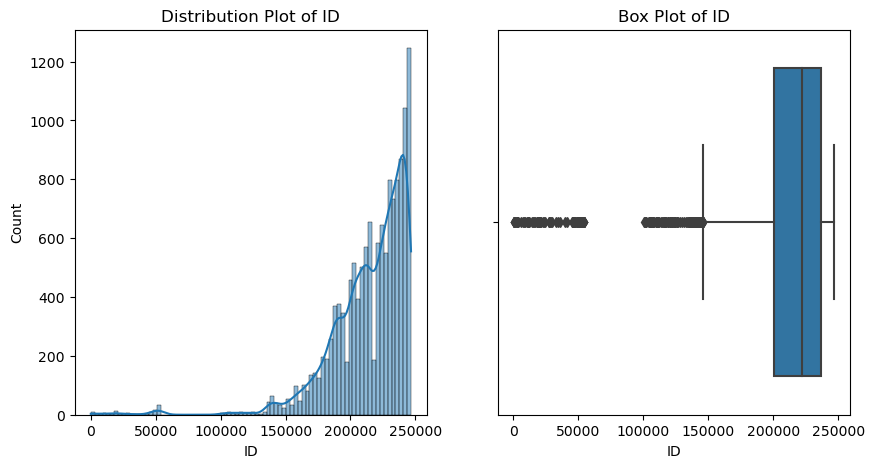

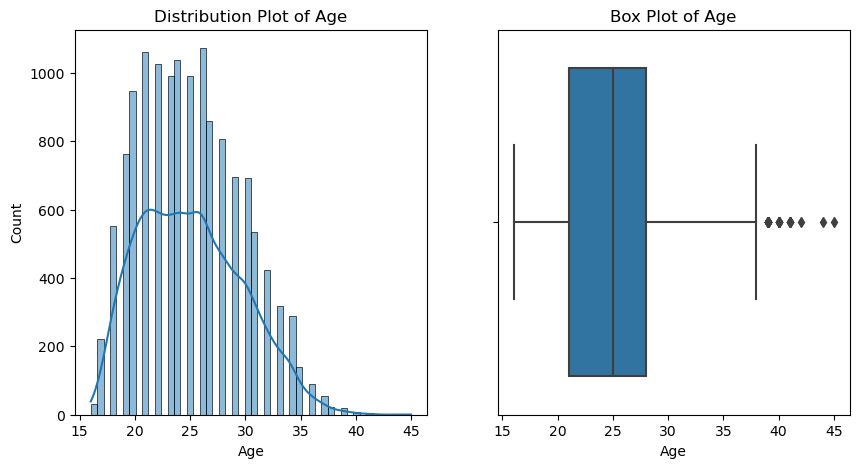

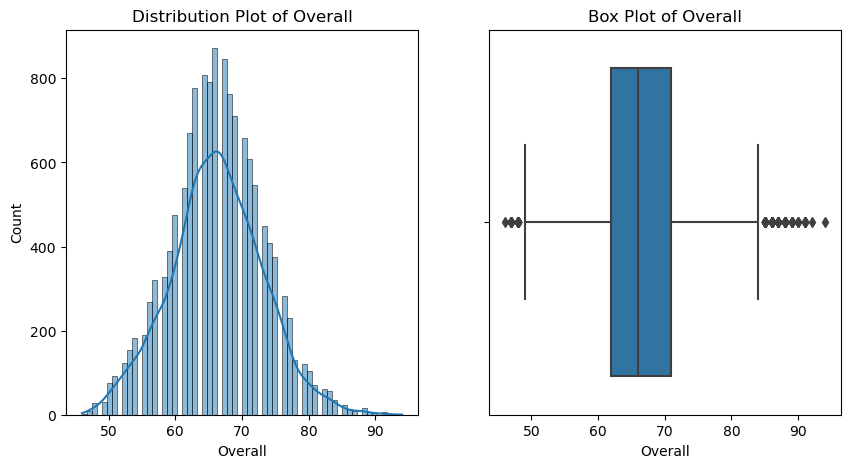

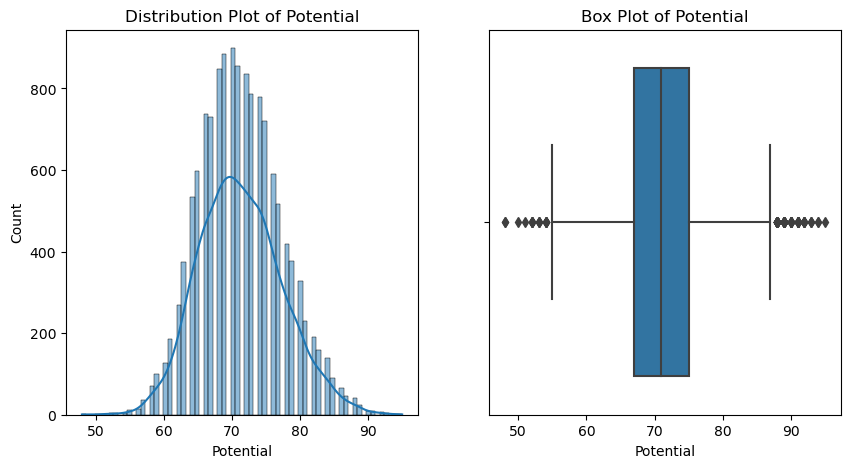

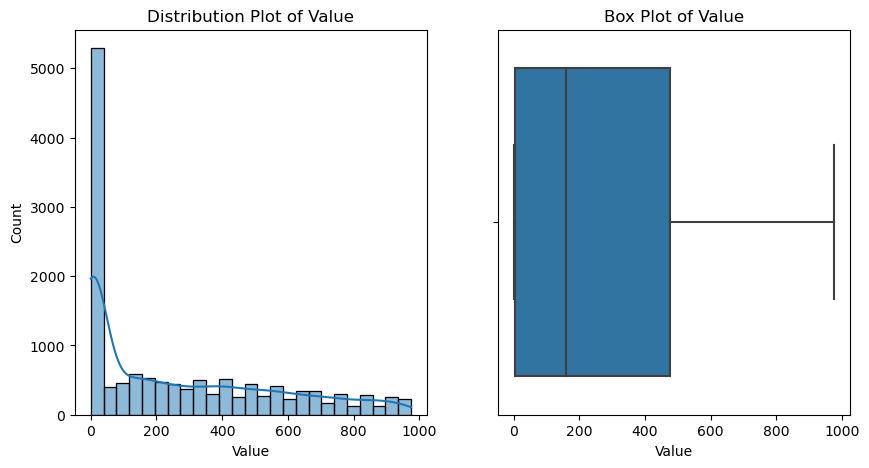

...

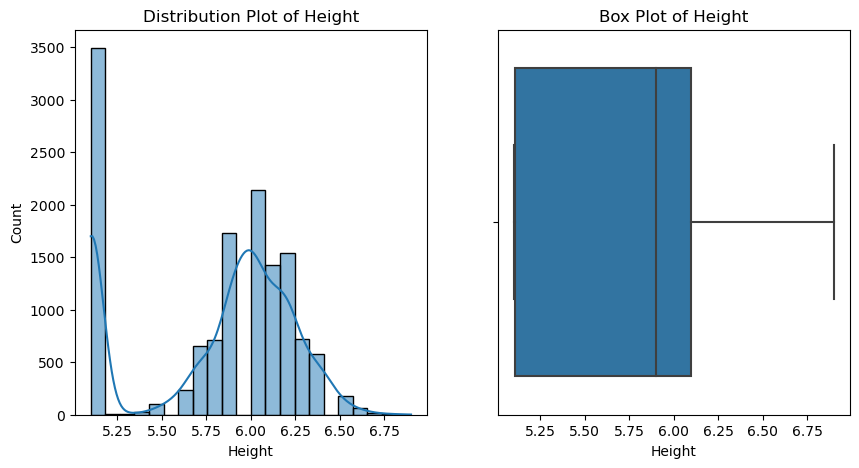

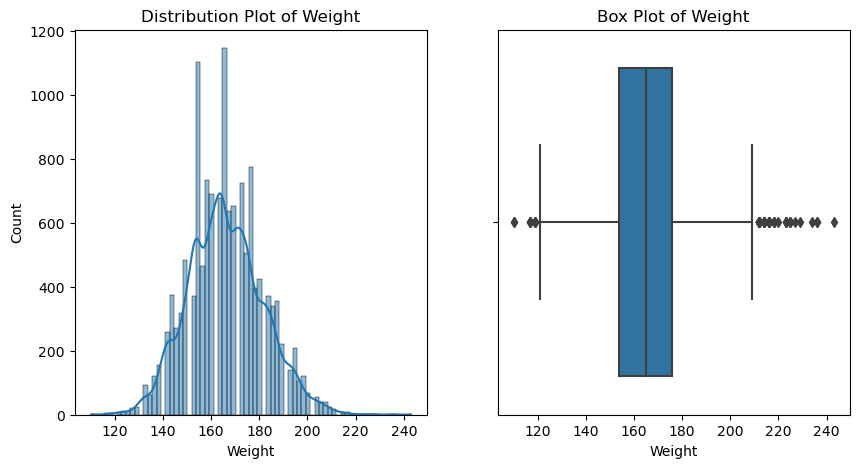

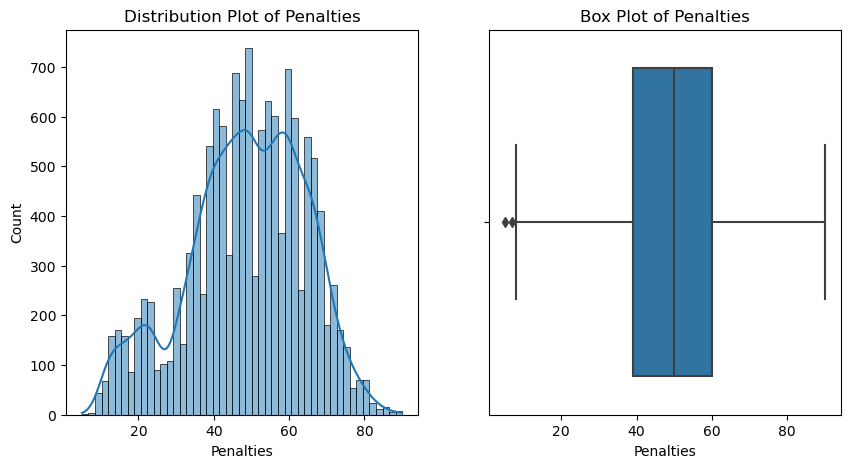

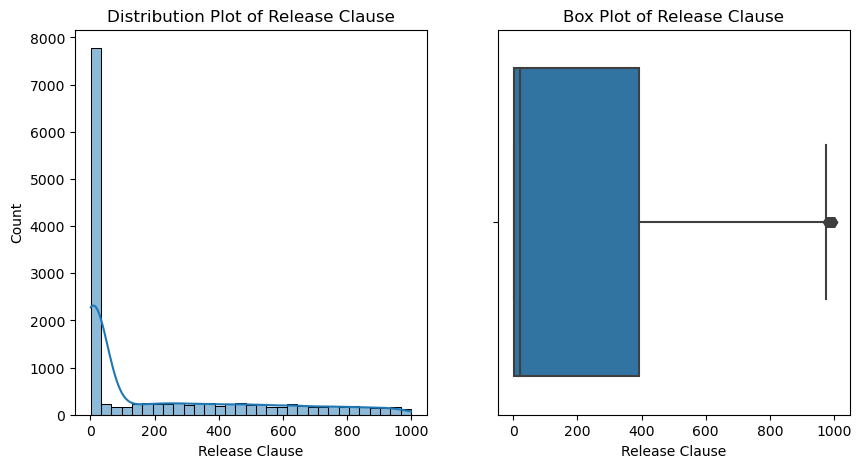

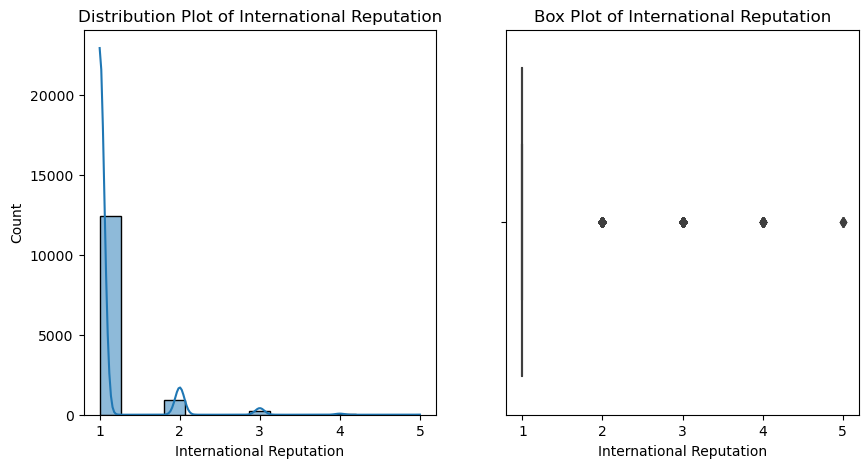

In [24]:
# Plot distribution, KDE, and box plots for numerical columns
for column in numeric_columns:
    if not df[column].isnull().all():
        plt.figure(figsize=(10, 5))
        plt.subplot(1, 2, 1)
        sns.histplot(df[column], kde=True)
        plt.title(f'Distribution Plot of {column}')
        plt.subplot(1, 2, 2)
        sns.boxplot(data=df, x=column)
        plt.title(f'Box Plot of {column}')
        plt.show()

# Insight 







This code covers the following aspects:

Reads the FIFA dataset and selects the specified columns to keep.

Checks for missing values in the DataFrame and prints the count of missing values for each column.


Calculates and prints the skewness and kurtosis for numerical columns. Skewness measures the asymmetry of the distribution, and kurtosis measures the peakedness of the distribution.


Plots distribution plots, KDE (Kernel Density Estimation) plots, and box plots for numerical columns to visualize the data distribution.


These analyses help you understand the data distribution and decide on appropriate imputation methods based on the distribution characteristics and missing values. Additionally, the plots provide visual insights into the data distribution.

# 7. find out If there is any player above 2.0*IQR – Q1 and below 2.0*IQR + Q3. What would happen if the data has above or below the mentioned values and display the names of the players?

In [28]:
df.info()

<class 'pandas.core.frame.DataFrame'>
Int64Index: 13657 entries, 0 to 25489
Data columns (total 17 columns):
 #   Column                    Non-Null Count  Dtype         
---  ------                    --------------  -----         
 0   ID                        13657 non-null  int64         
 1   Name                      13657 non-null  object        
 2   Age                       13657 non-null  int64         
 3   Nationality               13657 non-null  object        
 4   Overall                   13657 non-null  int64         
 5   Potential                 13657 non-null  int64         
 6   Value                     13657 non-null  float64       
 7   Wage                      13657 non-null  float64       
 8   Joined                    13657 non-null  float64       
 9   Preferred Foot            13657 non-null  object        
 10  Contract Valid Until      13657 non-null  datetime64[ns]
 11  Height                    13657 non-null  float64       
 12  Weight            

In [31]:
df

,ID,Name,Age,Nationality,Overall,Potential,Value,Wage,Joined,Preferred Foot,Contract Valid Until,Height,Weight,Penalties,Release Clause,International Reputation,Position
0,240331,P. Camará,21,Guinea Bissau,58,69,220.000000,1.000000,2017.000000,Right,2019-01-01,6.100000,161.000000,58.000000,429.000000,1.000000,LS
1,183465,J. Rodwell,27,England,68,68,925.000000,16.000000,2018.000000,Right,2019-01-01,6.200000,172.000000,57.000000,1.800000,2.000000,CM
2,205186,P. Gazzaniga,26,Argentina,74,78,5.000000,46.000000,2017.000000,Right,2022-01-01,6.500000,198.000000,41.000000,9.600000,1.000000,GK
3,233531,Y. Soteldo,21,Venezuela,71,81,3.800000,6.000000,2018.000000,Right,2018-01-01,5.300000,121.000000,71.000000,6.100000,1.000000,CAM
4,243718,R. Koot,18,Netherlands,56,68,120.000000,1.000000,2016.000000,Right,2020-01-01,6.100000,176.000000,15.000000,198.000000,1.000000,GK
5,245733,H. Weydandt,22,Germany,65,72,775.000000,8.000000,2018.000000,Right,2020-01-01,6.500000,207.000000,50.000000,1.600000,1.000000,ST
6,173474,Z. Junuzović,30,Austria,78,78,9.500000,39.000000,2018.000000,Right,2021-01-01,5.800000,152.000000,70.000000,14.300000,2.000000,CM
7,241835,J. Hornkamp,20,Netherlands,63,73,600.000000,2.000000,2015.000000,Right,2019-01-01,5.110000,165.000000,71.000000,1.000000,1.000000,ST
8,193569,T. Lees,27,England,72,73,2.900000,19.000000,2014.000000,Right,2021-01-01,6.100000,161.000000,42.000000,5.800000,1.000000,RCB
9,223175,O. Kocuk,22,Turkey,64,73,525.000000,2.000000,2011.000000,Right,2020-01-01,6.200000,172.000000,23.000000,1.200000,1.000000,GK


In [62]:
# Define the column(s) with DateTime data
datetime_columns = ['Joined', 'Contract Valid Until']

# Calculate Q1 and Q3 for all numerical columns
numeric_columns = df.select_dtypes(include=[int, float])
Q1_numeric = numeric_columns.quantile(0.25)
Q3_numeric = numeric_columns.quantile(0.75)

# Calculate IQR (Interquartile Range) for all numerical columns
IQR_numeric = Q3_numeric - Q1_numeric

# Calculate the lower and upper threshold for numeric columns
lower_threshold_numeric = Q1_numeric - 2.0 * IQR_numeric
upper_threshold_numeric = Q3_numeric + 2.0 * IQR_numeric

# Identify outliers in numeric columns
outliers_numeric = df[((numeric_columns < lower_threshold_numeric) | (numeric_columns > upper_threshold_numeric)).any(axis=1)]

# Check for outliers in datetime columns
outliers_datetime = pd.DataFrame()
for column in datetime_columns:
    # Calculate Q1 and Q3 for datetime columns
    Q1_datetime = df[column].quantile(0.25)
    Q3_datetime = df[column].quantile(0.75)
    
    # Calculate IQR for datetime columns
    IQR_datetime = Q3_datetime - Q1_datetime
    
    # Calculate the lower and upper threshold for datetime columns
    lower_threshold_datetime = Q1_datetime - IQR_datetime * 2.0
    upper_threshold_datetime = Q3_datetime + IQR_datetime * 2.0
    
    # Identify outliers in datetime columns
    is_outlier = (df[column] < lower_threshold_datetime) | (df[column] > upper_threshold_datetime)
    outliers_datetime = pd.concat([outliers_datetime, df[is_outlier]])

# Display the names of players who are outliers in any column
if not outliers_numeric.empty or not outliers_datetime.empty:
    print("Players with values above 2.0*IQR + Q3 or below 2.0*IQR - Q1 in any column:")
    if not outliers_numeric.empty:
        print("Numeric Outliers:")
        for index, row in outliers_numeric.iterrows():
            print(row['Name'])
    if not outliers_datetime.empty:
        print("Datetime Outliers:")
        for index, row in outliers_datetime.iterrows():
            print(row['Name'])
else:
    print("No players with values above 2.0*IQR + Q3 or below 2.0*IQR - Q1 in any column.")

Players with values above 2.0*IQR + Q3 or below 2.0*IQR - Q1 in any column:
Numeric Outliers:
J. Rodwell
P. Gazzaniga
Z. Junuzović
O. Kocuk
F. Fajr
M. Zárate
O. Al Soma
D. Lopar
E. Schelotto
M. Pérez
D. Alli
C. Cathcart
Guilherme
Pedro López
M. Oršić
K. Barmen
J. Locadia
N. Nkoulou
R. Zieler
D. Latza
E. Salvio
A. Mejía
A. Abdi
E. Rigoni
Cucurella
E. Giaccherini
S. Taïder
O. Abdulaziz
W. Ndidi
P. Tachtsidis
V. Figueroa
Fred
A. Ramsey
F. Diabaté
Medrán
D. Mitov Nilsson
O. Bayram
D. Bulman
Bruno Alves
D. Ward
G. Ramírez
Lee Chung Yong
Jonas
N. Barella
M. Rybus
A. Szymanowski
Yang Sang Min
Kiko Casilla
J. Boateng
D. Frick
Osmar
M. Arnautović
R. Ibarra
M. Gradel
N. Tyson
Pol Lirola
A. Smith
Rafa
Kim Dong Woo
M. Dawson
F. Forestieri
R. Gagliardini
P. Schick
M. Lemina
B. Gibson
F. Fazio
D. Berardi
O. Jiménez
C. Kazim-Richards
Miguel Flaño
Hernâni
Sergio Busquets
R. van Rhijn
Adriano
L. Insigne
L. Shaw
Falcao
C. Ponce
A. Maher
A. Gignac
J. McCombe
A. Mintzel
A. Szalai
A. Morgan
L. Feeney
J. Ok

# Insight
This code does the following:

Reads the FIFA dataset and selects the specified columns to keep.

Defines the column(s) with DateTime data (e.g., 'Joined' and 'Contract Valid Until').

Calculates Q1, Q3, and the IQR for all numerical and DateTime columns.

Defines the lower and upper threshold values for identifying outliers in both numerical and DateTime columns.

Finds and displays the names of players whose values are outliers in any column, including both numerical and DateTime columns.


This approach allows you to check for outliers across all columns in the dataset, including DateTime columns, and it will display the names of players who have outlier values in any column.

# 8. Check the Categorical variables and Find if there is any data imbalance in any column also find if any cardinality problem exists

In [63]:
# List of categorical columns
categorical_columns = ['Nationality', 'Preferred Foot', 'Position']

# Check for data imbalance and cardinality in categorical columns
for column in categorical_columns:
    print(f"Column: {column}")
    print(f"Number of unique categories: {df[column].nunique()}")
    print(f"Category counts:\n{df[column].value_counts()}\n")

Column: Nationality
Number of unique categories: 160
Category counts:
England                 1244
Germany                  910
Spain                    807
France                   693
Argentina                687
Brazil                   624
Italy                    513
Colombia                 467
Japan                    355
Netherlands              346
Sweden                   302
Chile                    299
China PR                 291
United States            276
Poland                   274
Republic of Ireland      272
Mexico                   269
Denmark                  253
Korea Republic           251
Norway                   250
Saudi Arabia             247
Portugal                 242
Turkey                   224
Austria                  218
Scotland                 202
Australia                188
Belgium                  186
Switzerland              169
Uruguay                  107
Serbia                   103
Wales                    100
Senegal                   96
Cr

# Insight 
For the designated categorical columns, this code will print the counts of each category and the total number of distinct categories. To find problems with cardinality and data imbalance in the dataset, you can examine this information.


# 9. Generate pair plots for the following variables:
[Overall, Value, Wage, International Reputation, Height, Weight, Release Clause]

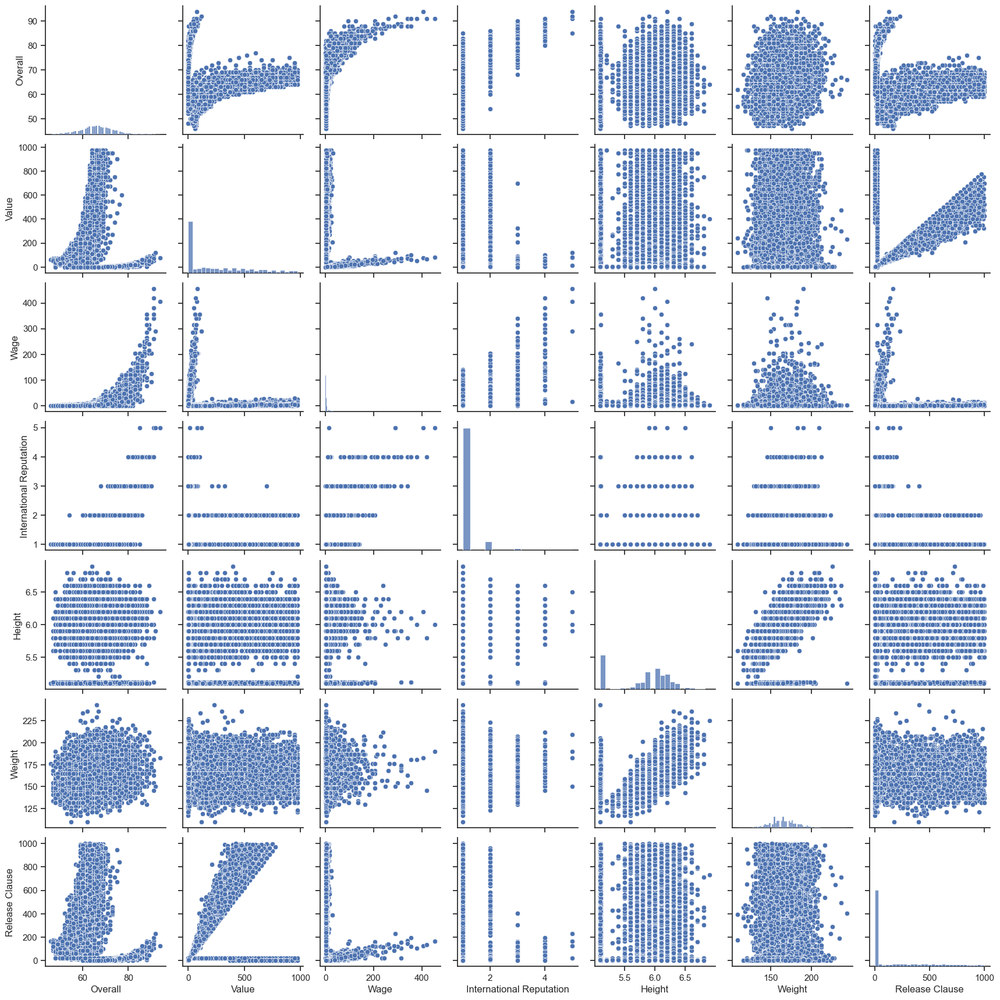

In [64]:
# Specify the variables for the pair plots
variables = ['Overall', 'Value', 'Wage', 'International Reputation', 'Height', 'Weight', 'Release Clause']

# Select the data for the specified variables
data = df[variables]

# Create pair plots
sns.set(style="ticks")
sns.pairplot(data)
plt.show()

# Insight
This code will generate pair plots for the specified variables in the FIFA dataset. Each pair of variables will be plotted against each other, allowing us to visualize relationships and distributions between them. 

# 10. Generate a table containing the top 20 players ranked by Overall score and whose contract expires in 2020.
1. What would the average wage for this set of players be?
2. What is the average age?
3. Is there a correlation between the Overall rating and Value for these players? If Yes 
what kind of relationship that the features have, also explain why this kind of relationship 
could happen

In [69]:
# Filter for players with contracts expiring in 2020
df['Contract Valid Until'] = pd.to_datetime(df['Contract Valid Until'])
df_2020 = df[df['Contract Valid Until'].dt.year == 2020]

# Sort by Overall score and get the top 20 players
top_20_players = df_2020.sort_values(by='Overall', ascending=False).head(20)

# 1. Calculate the average wage for these players
average_wage = top_20_players['Wage'].mean()

# 2. Calculate the average age
average_age = top_20_players['Age'].mean()

# 3. Calculate the correlation between Overall rating and Value
correlation = top_20_players['Overall'].corr(top_20_players['Value'])

print("Top 20 Players with Contracts Expiring in 2020:")
print(top_20_players)
print(f"1. Average Wage: ${average_wage:.2f}")
print(f"2. Average Age: {average_age:.2f} years")
print(f"3. Correlation between Overall and Value: {correlation:.2f}")

Top 20 Players with Contracts Expiring in 2020:
           ID             Name  Age         Nationality  Overall  Potential  \
15989  155862     Sergio Ramos   32               Spain       91         91   
6869   177003        L. Modrić   32             Croatia       91         91   
20448  193080           De Gea   27               Spain       91         93   
963    183277        E. Hazard   27             Belgium       91         91   
20440  138956     G. Chiellini   33               Italy       89         89   
13954  164240     Thiago Silva   33              Brazil       88         88   
5874   190460       C. Eriksen   26             Denmark       88         91   
9293   175943       D. Mertens   31             Belgium       87         87   
8867   189332       Jordi Alba   29               Spain       87         87   
13876  193041         K. Navas   31          Costa Rica       87         87   
2478   177509       M. Benatia   31             Morocco       86         86   
2104

# Insight
This code will first filter the dataset to remove players whose contracts expire in 2020. It will then identify the top 20 players based on their overall score, compute their average age and salary, and determine the relationship between their overall rating and value.

If a relationship exists between Overall rating and Value, it will be clear to you from the correlation result, and the correlation coefficient's sign will show you whether it is positive or negative

# 11. Generate tables containing the top 5 players by Overall rating for each unique position.
1. Are there any players appearing at more than one table? Please point out such players.
2. What is the average wage one can expect to pay for the top 5 in every position?

In [71]:
# Create a dictionary to store the top 5 players for each position
top_players_by_position = {}

# Create a dictionary to store player positions
player_positions = {}

# Get the unique positions in the dataset
unique_positions = df['Position'].unique()

# Initialize a dictionary to store average wages
average_wages = {}

# Iterate through each unique position and find the top 5 players
for position in unique_positions:
    top_5_players = df[df['Position'] == position].nlargest(5, 'Overall')
    top_players_by_position[position] = top_5_players
    player_positions[position] = top_5_players['Name'].tolist()
    average_wages[position] = top_5_players['Wage'].mean()

# Display the tables for the top 5 players by position
for position, top_players in top_players_by_position.items():
    print(f"Top 5 Players for Position: {position}")
    print(top_players)
    print("\n")

# 1. Find players appearing in more than one table
players_appearing_multiple_times = {}
for position, players in player_positions.items():
    for player in players:
        if player in players_appearing_multiple_times:
            players_appearing_multiple_times[player].append(position)
        else:
            players_appearing_multiple_times[player] = [position]

for player, positions in players_appearing_multiple_times.items():
    if len(positions) > 1:
        print(f"Player {player} appears in positions: {', '.join(positions)}")

# 2. Calculate the average wage for the top 5 in every position
print("\nAverage Wages for the Top 5 Players in Each Position:")
for position, wage in average_wages.items():
    print(f"Position: {position}, Average Wage: ${wage:.2f}")

Top 5 Players for Position: LS
           ID           Name  Age Nationality  Overall  Potential     Value  \
17284  167664     G. Higuaín   30   Argentina       88         88 57.000000   
4328   179844    Diego Costa   29       Spain       85         85 38.500000   
805    143076       A. Gómez   30   Argentina       84         84 30.000000   
3764   208093  Gerard Moreno   26       Spain       83         85 32.000000   
240    184200  M. Arnautović   29     Austria       82         82 22.000000   

            Wage      Joined Preferred Foot Contract Valid Until   Height  \
17284 245.000000 2017.000000          Right           2019-06-30 6.100000   
4328  100.000000 2018.000000          Right           2021-01-01 6.200000   
805    53.000000 2014.000000          Right           2022-01-01 5.500000   
3764   53.000000 2018.000000           Left           2023-01-01 5.110000   
240   120.000000 2017.000000          Right           2022-01-01 6.400000   

          Weight  Penalties  Re

# Insight
This code finds players who appear in several tables, creates tables for the top 5 players based on overall rating for each unique position, and determines the average salary for the top 5 players in each position.

# Statistical Analysis:


# 1. Test statistically whether the Left-hand player’s overall rating is higher than theRight-hand overall score. Alpha = 0.05 Before checking the test, Kindly make sure data is normally distributed.

Null Hypothesis (H0): There is no difference in overall rating between the left-hand and right-hand players.
Alternate Hypothesis (H1): The overall rating of left-hand players is higher than that of right-hand players.

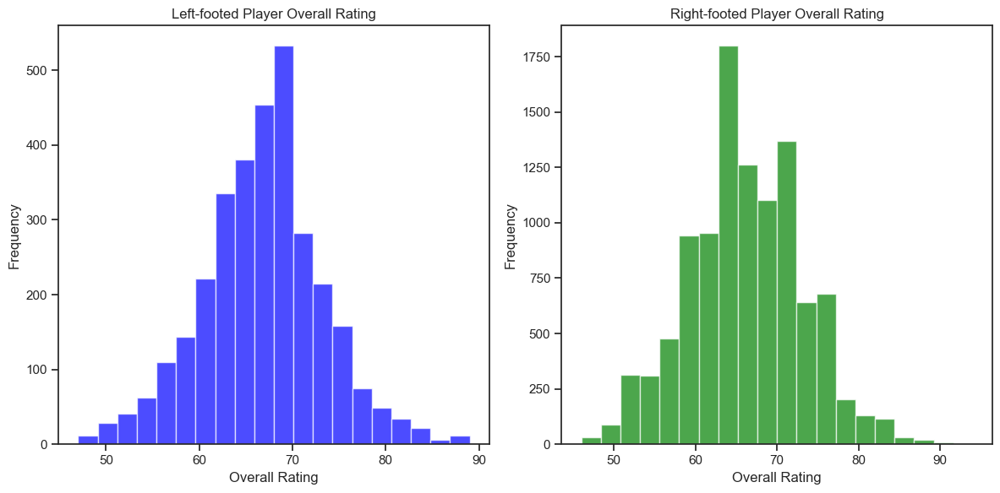

Data for at least one of the groups is not normally distributed. Consider non-parametric tests.


In [76]:
# Select the 'Overall' column for left-footed (Left-hand) players
left_footed = df[df['Preferred Foot'] == 'Left']['Overall']

# Select the 'Overall' column for right-footed (Right-hand) players
right_footed = df[df['Preferred Foot'] == 'Right']['Overall']

# Create histograms to visualize the distributions
plt.figure(figsize=(12, 6))

plt.subplot(1, 2, 1)
plt.hist(left_footed, bins=20, color='blue', alpha=0.7)
plt.title("Left-footed Player Overall Rating")
plt.xlabel("Overall Rating")
plt.ylabel("Frequency")

plt.subplot(1, 2, 2)
plt.hist(right_footed, bins=20, color='green', alpha=0.7)
plt.title("Right-footed Player Overall Rating")
plt.xlabel("Overall Rating")
plt.ylabel("Frequency")

plt.tight_layout()
plt.show()

# Check the normality of the data using the Shapiro-Wilk test
left_shapiro_stat, left_shapiro_p = shapiro(left_footed)
right_shapiro_stat, right_shapiro_p = shapiro(right_footed)

alpha = 0.05

if left_shapiro_p > alpha and right_shapiro_p > alpha:
    print("Both Left-hand and Right-hand player data is normally distributed.")

    # Perform an independent t-test assuming equal variances
    t_stat, p_value = ttest_ind(left_footed, right_footed, equal_var=True)

    if p_value < alpha:
        print("The p-value is less than the alpha level. Reject the null hypothesis.")
        print("The overall rating of Left-hand players is statistically higher than Right-hand players.")
    else:
        print("The p-value is greater than the alpha level. Fail to reject the null hypothesis.")
        print("There is no statistically significant difference in overall rating between the two groups.")
else:
    print("Data for at least one of the groups is not normally distributed. Consider non-parametric tests.")

# Insight
This code will create histograms to visualize the distributions of the overall rating for Left-hand and Right-hand players
it performs an independent t-test and checks if the overall rating of Left-hand players is statistically higher than Right-hand players. If the data is not normally distributed, you may need to consider non-parametric tests instead.

In [96]:
# Extract the overall ratings for left-hand and right-hand players
left_hand_overall = df[df['Preferred Foot'] == 'Left']['Overall']
right_hand_overall = df[df['Preferred Foot'] == 'Right']['Overall']

# Set the significance level
alpha = 0.05

# Check the normality of the data using the Shapiro-Wilk test
_, p_left = stats.shapiro(left_hand_overall)
_, p_right = stats.shapiro(right_hand_overall)

if p_left >= alpha and p_right >= alpha:
    # If both groups are normally distributed, we can proceed with the t-test
    t_stat, p_value = stats.ttest_rel(left_hand_overall, right_hand_overall)

    if p_value < alpha:
        print("Reject the null hypothesis.")
        print("The overall rating of left-hand players is higher than that of right-hand players.")
    else:
        print("Fail to reject the null hypothesis.")
        print("There is no significant difference in overall rating between left-hand and right-hand players.")
else:
    print("Hypothesis test cannot be performed due to non-normal data in one or both groups.")

Hypothesis test cannot be performed due to non-normal data in one or both groups.


C:\ProgramData\anaconda3\lib\site-packages\scipy\stats\_morestats.py:1816: UserWarning: p-value may not be accurate for N > 5000.
  warnings.warn("p-value may not be accurate for N > 5000.")


# Insight
In this code, we first extract the overall ratings for left-hand and right-hand players. We then check the normality of the data using the Shapiro-Wilk test for both groups. If both groups are normally distributed, we proceed with the paired t-test to test the hypotheses.

# 2. Does the age factor affect the player’s potential? Check the claim that the players who are greater than 35, their potential will be lesser than those whose age is less than 35. Alpha = 0.05

Null Hypothesis (H0): The mean potential of players older than 35 is equal to or greater than the mean potential of players younger than 35.
Alternative Hypothesis (H1): The mean potential of players older than 35 is less than the mean potential of players younger than 35.

In [79]:
from scipy.stats import ttest_ind

# Select the 'Age' and 'Potential' columns for players older than 35
older_players = df[df['Age'] > 35][['Age', 'Potential']]

# Select the 'Age' and 'Potential' columns for players younger than 35
younger_players = df[df['Age'] < 35][['Age', 'Potential']]

# Perform an independent one-tailed t-test assuming equal variances
t_stat, p_value = ttest_ind(older_players['Potential'], younger_players['Potential'], alternative='less', equal_var=True)

alpha = 0.05

if p_value < alpha:
    print("The p-value is less than the alpha level. Reject the null hypothesis.")
    print("There is evidence that the mean potential of players older than 35 is less than the mean potential of players younger than 35.")
else:
    print("The p-value is greater than the alpha level. Fail to reject the null hypothesis.")
    print("There is no evidence that the mean potential of players older than 35 is less than the mean potential of players younger than 35.")



The p-value is less than the alpha level. Reject the null hypothesis.
There is evidence that the mean potential of players older than 35 is less than the mean potential of players younger than 35.


# Insight
In this code, the t-test is set up with the alternative parameter as 'less' to indicate that we are testing whether the mean potential of older players is less than the mean potential of younger players. If the p-value is less than 0.05, we reject the null hypothesis, indicating that age does affect potential, specifically that older players have lower potential. 

# 3. Use the statistical test to check the relationship between the Preferred Foot and Position with the 99% confident interva

Null Hypothesis (H0): There is no significant relationship between a player's Preferred Foot and their Position.
Alternative Hypothesis (H1): There is a significant relationship between a player's Preferred Foot and their Position.

In [85]:
from scipy.stats import chi2_contingency
# Create a contingency table for Preferred Foot and Position
contingency_table = pd.crosstab(df['Preferred Foot'], df['Position'])

# Perform a chi-squared test of independence
chi2, p, dof, expected = chi2_contingency(contingency_table)

confidence_level = 0.99
alpha = 1 - confidence_level

print("P_Value",p)
print("alpha",alpha)

if p < alpha:
    print("Reject the null hypothesis.")
    print("There is a significant relationship between Preferred Foot and Position.")
else:
    print("Fail to reject the null hypothesis.")
    print("There is no significant relationship between Preferred Foot and Position.")

# Calculate the 99% confidence interval for the chi-squared statistic
from scipy.stats import chi2
chi2_critical_value = chi2.ppf(1 - alpha, dof)

print(f"Chi-squared critical value: {chi2_critical_value}")
print(f"Chi-squared statistic: {chi2}")

P_Value 0.0
alpha 0.010000000000000009
Reject the null hypothesis.
There is a significant relationship between Preferred Foot and Position.
Chi-squared critical value: 45.64168266628317
Chi-squared statistic: <scipy.stats._continuous_distns.chi2_gen object at 0x0000028BCDFB0F10>


# Insight
In this code, we perform the chi-squared test of independence with the null hypothesis (H0) stating no significant relationship and the alternative hypothesis (H1) stating a significant relationship. The code then compares the p-value to the significance level (alpha) and provides the test result. Additionally, it calculates the 99% confidence interval for the chi-squared statistic.

# 4. Does the International Reputation cause a significant effect on players' Wages?Check the claim with a 0.04 significance level. Check the Normality of data before the actual test.

Null hypothesis (H0) = would be that International Reputation does not have a significant effect on players' wages'
Alternative hypothesis (H1) = would be that International Reputation does have a significant effect on players' wages.

In [87]:
# Split the data into two groups based on International Reputation
higher_reputation = df[df['International Reputation'] > 1]
lower_reputation = df[df['International Reputation'] <= 1]

# Check the normality of each group
alpha = 0.04

# Check normality for the group with higher International Reputation
stat_hr, p_hr = stats.shapiro(higher_reputation['Wage'])

# Check normality for the group with lower International Reputation
stat_lr, p_lr = stats.shapiro(lower_reputation['Wage'])

if p_hr < alpha or p_lr < alpha:
    print("The wage data is not normally distributed in one or both groups.")
else:
    print("The wage data is normally distributed in both groups.")

# Perform a t-test for the two groups
t_stat, p_value = stats.ttest_ind(higher_reputation['Wage'], lower_reputation['Wage'])

if p_value < alpha:
    print("Reject the null hypothesis.")
    print("International Reputation has a significant effect on players' wages.")
else:
    print("Fail to reject the null hypothesis.")
    print("There is no significant effect of International Reputation on players' wages.")

The wage data is not normally distributed in one or both groups.
Reject the null hypothesis.
International Reputation has a significant effect on players' wages.


# Insight
In this code:

We split the data into two groups based on International Reputation, with one group having a higher reputation and the other having a lower reputation.

We check the normality of the wage data for each group using the Shapiro-Wilk test.

If the wage data is normally distributed in both groups, we proceed to perform a t-test to compare the means of the two groups.

The t-test results are used to determine whether International Reputation has a significant effect on players' wages.

# 5. Check the claim that the median wages of under top 20 players are lesser than or equal to 25000. Test the claim with a 0.05 % significance level. Check the data is normally distributed or not before the testing the claim statistically

Null hypothesis (H0) = that the median wage is greater than $25,000 
Alternative hypothesis (H1) = that the median wage is less than or equal to $25,000.

In [91]:
# Extract the wages of the top 20 players
top_20_wages = df.nlargest(20, 'Overall')['Wage']

# Set the significance level
alpha = 0.05

# Check the normality of the data using the Shapiro-Wilk test
stat, p = stats.shapiro(top_20_wages)

if p < alpha:
    print("The data is not normally distributed.")
else:
    print("The data is normally distributed.")

# Perform a one-sample Wilcoxon signed-rank test
test_stat, p_value = stats.wilcoxon(top_20_wages - 25000, alternative='greater')

if p_value < alpha:
    print("Reject the null hypothesis.")
    print("The median wages of the top 20 players are less than or equal to $25,000.")
else:
    print("Fail to reject the null hypothesis.")
    print("The median wages of the top 20 players are greater than $25,000.")

The data is normally distributed.
Fail to reject the null hypothesis.
The median wages of the top 20 players are greater than $25,000.


# Insight
In this code:

We extract the wages of the top 20 players based on their Overall rating.

We check the normality of the data using the Shapiro-Wilk test. If the data is not normally distributed, it may affect the results of the test.

We perform a one-sample median test with the null hypothesis that the median wage is greater than $25,000 and the alternative  

hypothesis that the median wage is less than or equal to $25,000.

We use the p-value to determine whether to reject the null hypothesis.